In [1]:
import pandas as pd

building_data = pd.read_csv("/content/building_data.csv")
climate_data = pd.read_csv("/content/climate_data.csv")
target_data = pd.read_csv("/content/target_labels.csv")

In [2]:
building_data

,Building_Material,Insulation,Age,HVAC_System,Window_Type,Roof_Type,Floor_Area,Energy_Efficiency_Rating,Occupancy_Type
0,Steel,0.544943,47.0,Radiant Heating,Double Pane,Pitched,1452.039305,3.264835,Commercial
1,Concrete,0.559295,41.0,Heat Pump,Triple Pane,Flat,4388.733819,1.644215,Industrial
2,Brick,NaN,48.0,Radiant Heating,Single Pane,Pitched,1002.849876,2.958944,Industrial
3,Concrete,0.910143,31.0,Heat Pump,Double Pane,Shingle,826.920475,4.227642,Commercial
4,Concrete,NaN,19.0,Heat Pump,Triple Pane,Shingle,983.038444,1.477479,Residential
...,...,...,...,...,...,...,...,...,...
10319,Steel,NaN,29.0,Central Heating,Double Pane,Flat,4262.551369,1.790952,Industrial
10320,Brick,0.705618,22.0,Heat Pump,Single Pane,Flat,2737.194936,1.729071,Residential
10321,Concrete,NaN,3.0,Central Heating,Double Pane,Pitched,4622.345683,4.661430,Residential
10322,Wood,0.636958,33.0,Radiant Heating,Triple Pane,Flat,2030.860092,3.393585,Residential


In [3]:
climate_data

,Outdoor_Temperature,Humidity,Air_Quality_Index,Precipitation,Wind_Speed,Sunlight_Exposure,Geographical_Location,Elevation
0,-7.458587,62.571065,18,1.323074,19.335465,7.319960,Suburban,1159.224807
1,39.838361,47.087208,21,6.224348,16.166798,6.622994,Urban,1949.544358
2,27.474188,38.140021,32,7.955146,15.101386,6.694288,Suburban,1519.068449
3,5.025197,59.314281,40,2.314466,4.054951,2.667836,Rural,216.280859
4,34.278336,33.322465,57,3.348547,19.129447,5.148868,Suburban,904.678662
...,...,...,...,...,...,...,...,...
8637,19.260765,58.793719,81,7.357584,17.966470,10.150112,Urban,455.878724
8638,21.069300,42.041690,91,7.455987,15.753426,0.984042,Suburban,1761.747906
8639,19.965991,36.204221,25,8.764248,9.560454,8.018237,Rural,283.019338
8640,16.566585,31.499492,91,7.529724,1.935795,0.743571,Urban,1927.473962


In [4]:
target_data

,Climate_Impact
0,Negative
1,Neutral
2,Negative
3,Positive
4,Negative
...,...
49995,Negative
49996,Negative
49997,Negative
49998,Negative


In [5]:
building_data['artificial_key'] = range(len(building_data))
climate_data['artificial_key'] = range(len(climate_data))
target_data['artificial_key'] = range(len(target_data))

combined_df = pd.merge(building_data, climate_data, on='artificial_key', how='outer')
combined_df = combined_df.merge(target_data, on='artificial_key', how='outer')

combined_df.fillna(method='ffill', inplace=True)

print(combined_df)

      Building_Material  Insulation   Age      HVAC_System  Window_Type  \
0                 Steel    0.544943  47.0  Radiant Heating  Double Pane   
1              Concrete    0.559295  41.0        Heat Pump  Triple Pane   
2                 Brick    0.559295  48.0  Radiant Heating  Single Pane   
3              Concrete    0.910143  31.0        Heat Pump  Double Pane   
4              Concrete    0.910143  19.0        Heat Pump  Triple Pane   
...                 ...         ...   ...              ...          ...   
49995             Steel    0.800000  33.0  Radiant Heating  Triple Pane   
49996             Steel    0.800000  33.0  Radiant Heating  Triple Pane   
49997             Steel    0.800000  33.0  Radiant Heating  Triple Pane   
49998             Steel    0.800000  33.0  Radiant Heating  Triple Pane   
49999             Steel    0.800000  33.0  Radiant Heating  Triple Pane   

      Roof_Type   Floor_Area  Energy_Efficiency_Rating Occupancy_Type  \
0       Pitched  1452.0393

In [27]:
import pandas as pd

missing_values = combined_df.isnull().sum()

print("Columns with missing values:")
print(missing_values[missing_values > 0])

Columns with missing values:
Series([], dtype: int64)


In [29]:
combined_df.dtypes

Insulation                  float64
Age                         float64
HVAC_System                  object
Window_Type                  object
Roof_Type                    object
Floor_Area                  float64
Energy_Efficiency_Rating    float64
Occupancy_Type               object
artificial_key                int64
Outdoor_Temperature         float64
Humidity                    float64
Air_Quality_Index           float64
Precipitation               float64
Wind_Speed                  float64
Sunlight_Exposure           float64
Elevation                   float64
Climate_Impact               object
dtype: object

In [30]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
combined_df[['Insulation', 'Age', 'Floor_Area', 'Energy_Efficiency_Rating', 'Humidity']] = scaler.fit_transform(combined_df[['Insulation', 'Age', 'Floor_Area', 'Energy_Efficiency_Rating', 'Humidity']])

In [6]:
print(combined_df.isnull().sum())

Building_Material           0
Insulation                  0
Age                         0
HVAC_System                 0
Window_Type                 0
Roof_Type                   0
Floor_Area                  0
Energy_Efficiency_Rating    0
Occupancy_Type              0
artificial_key              0
Outdoor_Temperature         0
Humidity                    0
Air_Quality_Index           0
Precipitation               0
Wind_Speed                  0
Sunlight_Exposure           0
Geographical_Location       0
Elevation                   0
Climate_Impact              0
dtype: int64


In [7]:
print(combined_df.describe())

         Insulation           Age    Floor_Area  Energy_Efficiency_Rating  \
count  50000.000000  50000.000000  50000.000000              50000.000000   
mean       0.789883     31.447040   2178.360336                  3.309573   
std        0.069055      7.260254    657.916423                  0.550345   
min        0.500366      1.000000    500.247914                  1.000056   
25%        0.800000     33.000000   2030.860092                  3.393585   
50%        0.800000     33.000000   2030.860092                  3.393585   
75%        0.800000     33.000000   2030.860092                  3.393585   
max        0.999872     50.000000   4998.584140                  4.999935   

       artificial_key  Outdoor_Temperature      Humidity  Air_Quality_Index  \
count    50000.000000         50000.000000  50000.000000       50000.000000   
mean     24999.500000            19.175097     66.720261          39.290620   
std      14433.901067             6.274672     10.443616          13.

In [8]:
print(combined_df.groupby('Building_Material')['Elevation'].mean())

Building_Material
Brick       1135.377869
Concrete    1157.234207
Steel       1880.575496
Wood        1164.697821
Name: Elevation, dtype: float64


Axes(0.125,0.11;0.775x0.77)


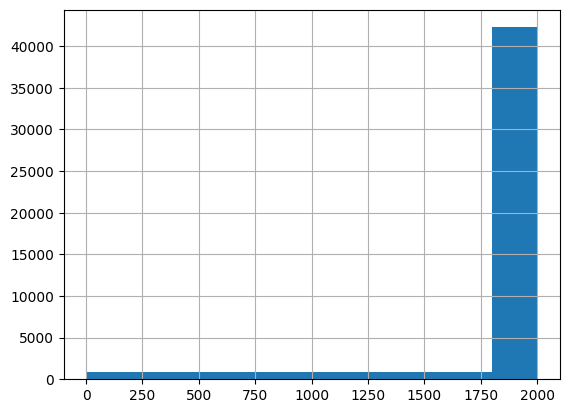

In [9]:
print(combined_df['Elevation'].hist())

In [10]:
print(combined_df.corr())

                          Insulation       Age  Floor_Area  \
Insulation                  1.000000  0.112022   -0.123697   
Age                         0.112022  1.000000   -0.177503   
Floor_Area                 -0.123697 -0.177503    1.000000   
Energy_Efficiency_Rating    0.092695  0.118341   -0.131529   
artificial_key              0.201058  0.294070   -0.307940   
Outdoor_Temperature         0.060900  0.104436   -0.120261   
Humidity                    0.172210  0.265814   -0.281841   
Air_Quality_Index          -0.096160 -0.140223    0.148002   
Precipitation              -0.045707 -0.040855    0.045109   
Wind_Speed                 -0.191944 -0.292310    0.312209   
Sunlight_Exposure          -0.201426 -0.296273    0.325733   
Elevation                   0.198993  0.301055   -0.330862   

                          Energy_Efficiency_Rating  artificial_key  \
Insulation                                0.092695        0.201058   
Age                                       0.118341   

<ipython-input-10-97fd6f45a67d>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(combined_df.corr())


In [11]:
print(combined_df.columns)

Index(['Building_Material', 'Insulation', 'Age', 'HVAC_System', 'Window_Type',
       'Roof_Type', 'Floor_Area', 'Energy_Efficiency_Rating', 'Occupancy_Type',
       'artificial_key', 'Outdoor_Temperature', 'Humidity',
       'Air_Quality_Index', 'Precipitation', 'Wind_Speed', 'Sunlight_Exposure',
       'Geographical_Location', 'Elevation', 'Climate_Impact'],
      dtype='object')


In [12]:
print(combined_df['Elevation'].apply(lambda x: x - 15))

0        1144.224807
1        1934.544358
2        1504.068449
3         201.280859
4         889.678662
            ...     
49995    1912.473962
49996    1912.473962
49997    1912.473962
49998    1912.473962
49999    1912.473962
Name: Elevation, Length: 50000, dtype: float64


In [13]:
combined_df.dtypes

Building_Material            object
Insulation                  float64
Age                         float64
HVAC_System                  object
Window_Type                  object
Roof_Type                    object
Floor_Area                  float64
Energy_Efficiency_Rating    float64
Occupancy_Type               object
artificial_key                int64
Outdoor_Temperature         float64
Humidity                    float64
Air_Quality_Index           float64
Precipitation               float64
Wind_Speed                  float64
Sunlight_Exposure           float64
Geographical_Location        object
Elevation                   float64
Climate_Impact               object
dtype: object

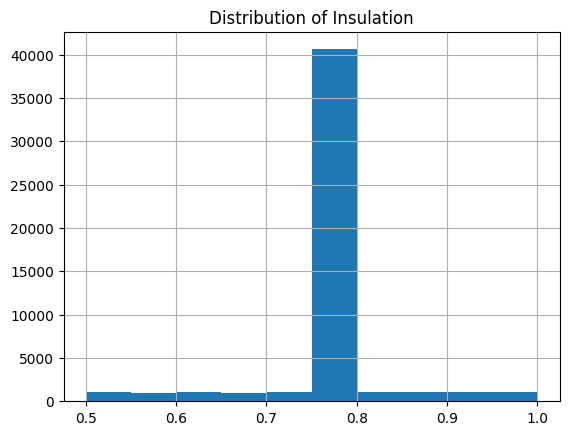

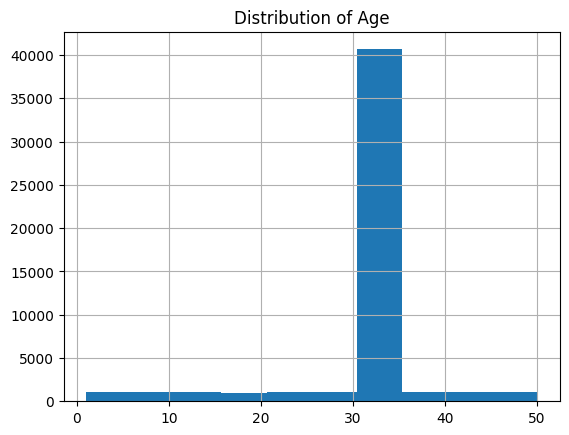

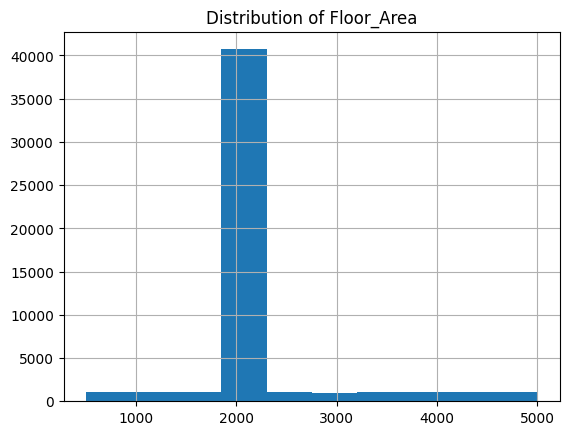

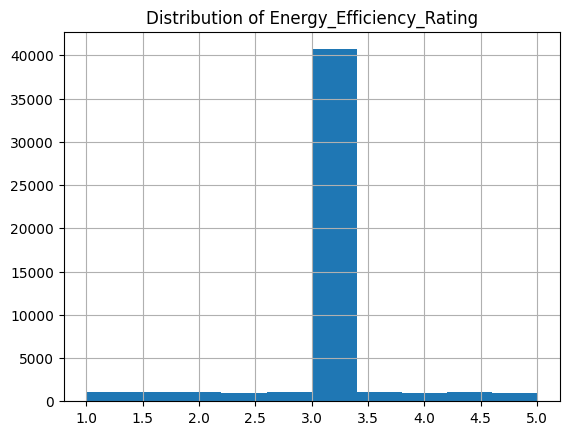

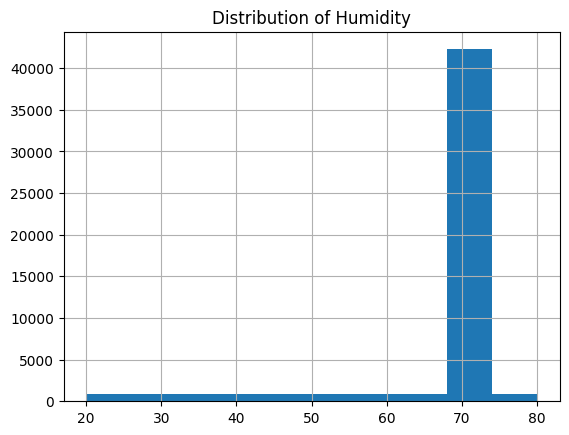

...

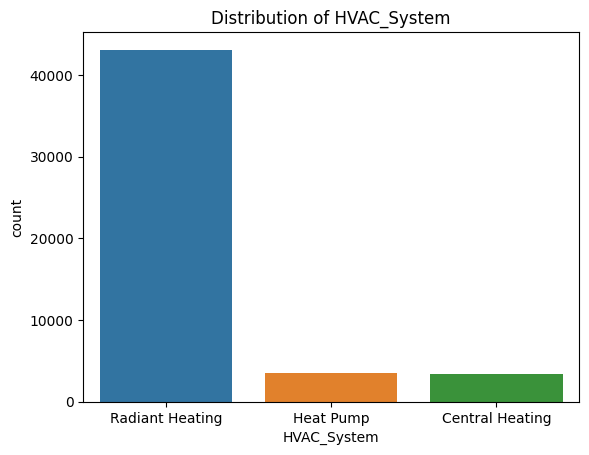

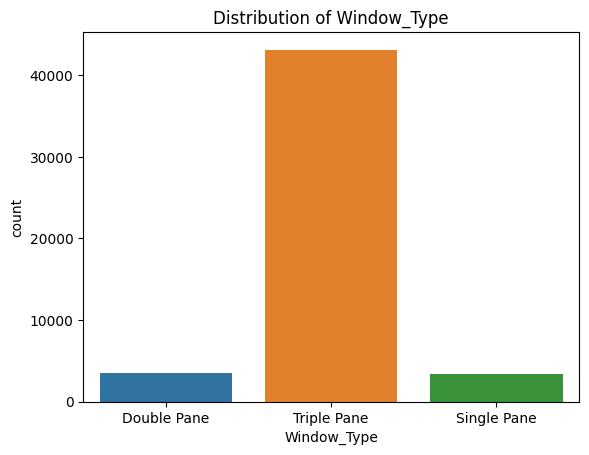

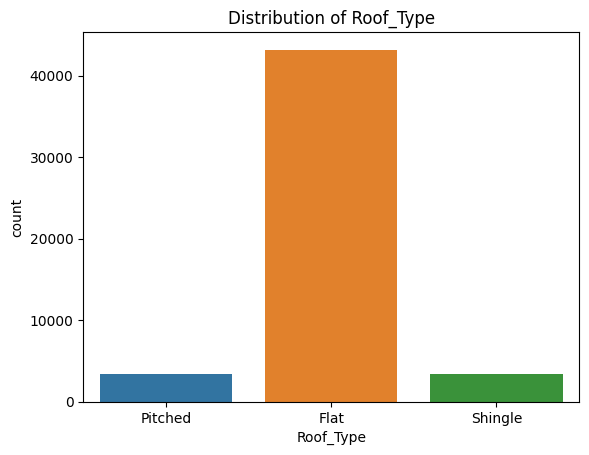

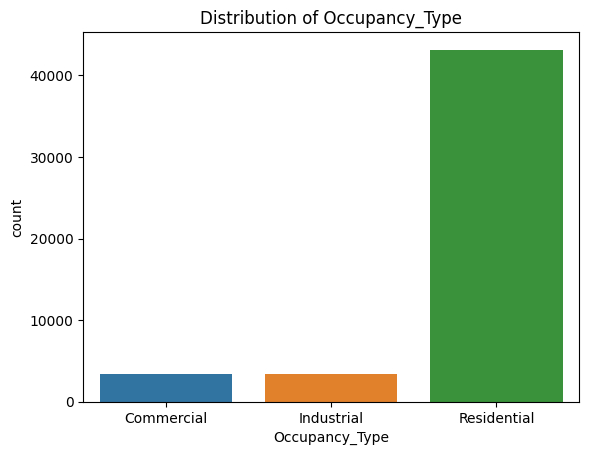

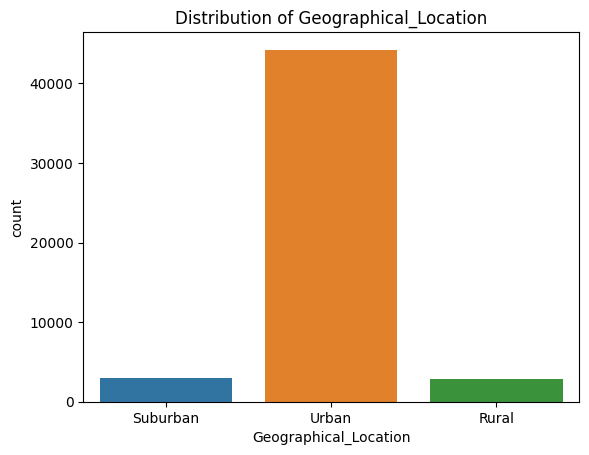

         Insulation           Age    Floor_Area  Energy_Efficiency_Rating  \
count  50000.000000  50000.000000  50000.000000              50000.000000   
mean       0.789883     31.447040   2178.360336                  3.309573   
std        0.069055      7.260254    657.916423                  0.550345   
min        0.500366      1.000000    500.247914                  1.000056   
25%        0.800000     33.000000   2030.860092                  3.393585   
50%        0.800000     33.000000   2030.860092                  3.393585   
75%        0.800000     33.000000   2030.860092                  3.393585   
max        0.999872     50.000000   4998.584140                  4.999935   

       artificial_key  Outdoor_Temperature      Humidity  Air_Quality_Index  \
count    50000.000000         50000.000000  50000.000000       50000.000000   
mean     24999.500000            19.175097     66.720261          39.290620   
std      14433.901067             6.274672     10.443616          13.

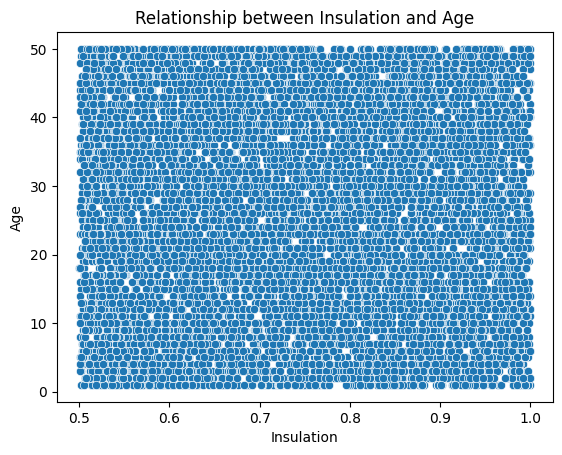

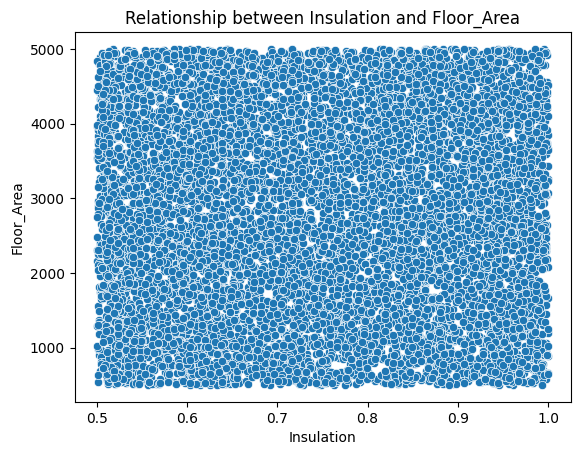

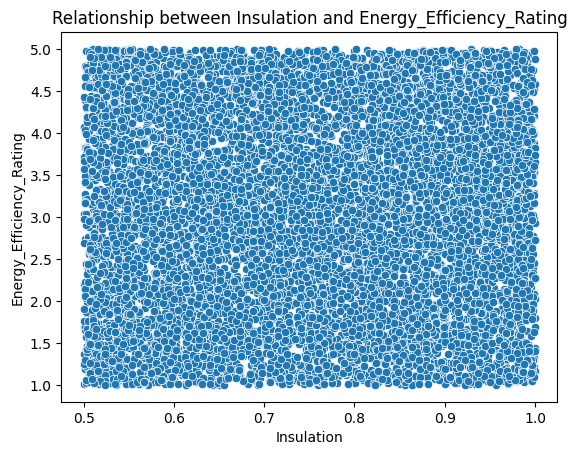

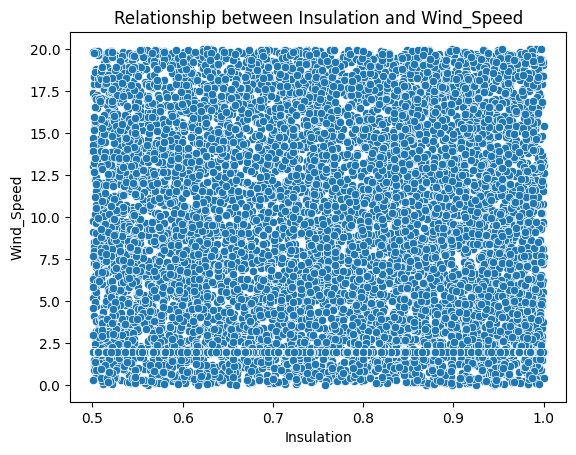

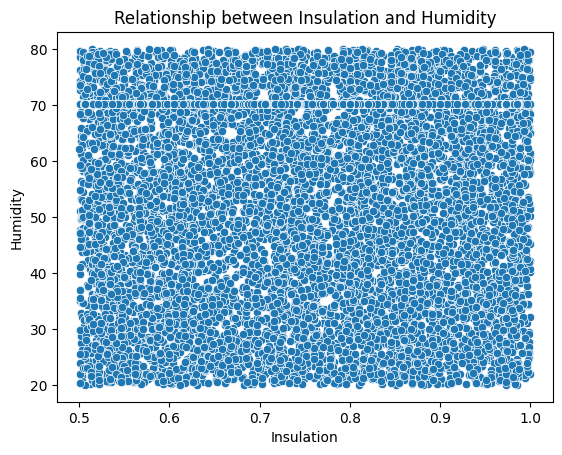

...

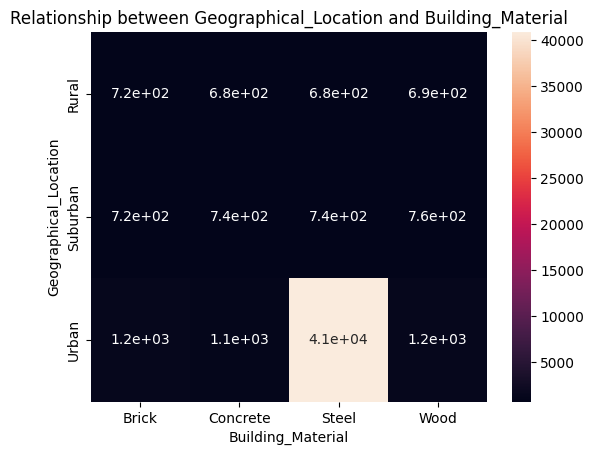

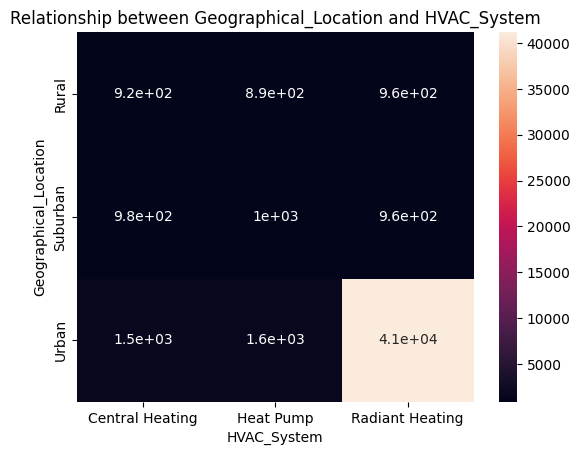

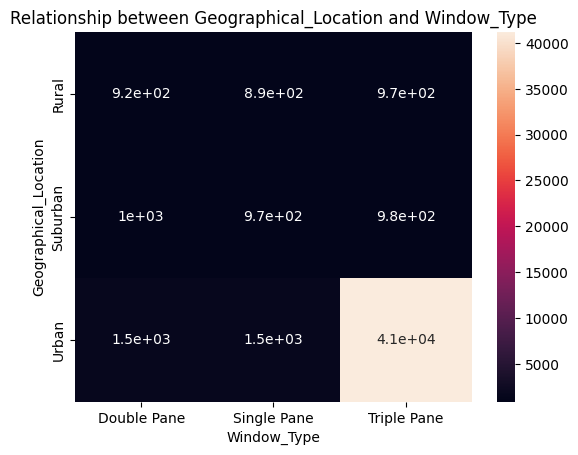

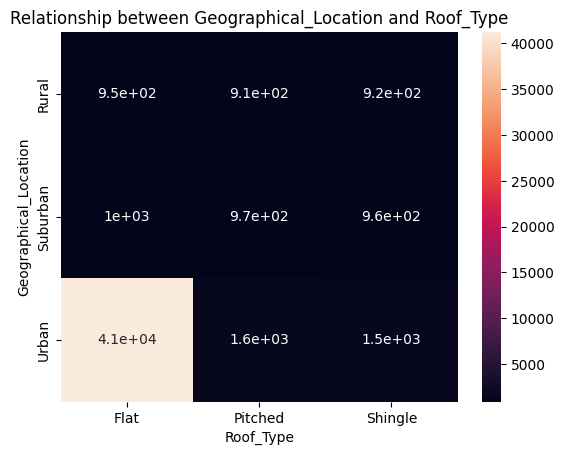

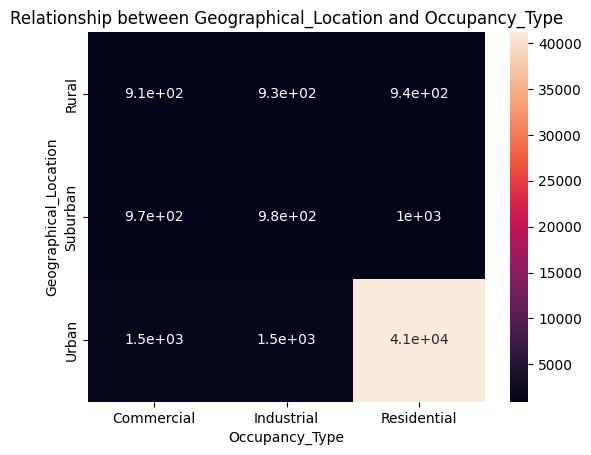

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

numerical_columns = ['Insulation', 'Age', 'Floor_Area', 'Energy_Efficiency_Rating', 'Humidity']

for column in numerical_columns:
    combined_df[column].hist()
    plt.title(f'Distribution of {column}')
    plt.show()

categorical_columns = ['Building_Material', 'HVAC_System', 'Window_Type', 'Roof_Type', 'Occupancy_Type', 'Geographical_Location']

for column in categorical_columns:
    sns.countplot(x=column, data=combined_df)
    plt.title(f'Distribution of {column}')
    plt.show()

print(combined_df.describe())

numerical_columns = ['Insulation', 'Age', 'Floor_Area', 'Energy_Efficiency_Rating', 'Wind_Speed', 'Humidity']

for column1 in numerical_columns:
    for column2 in numerical_columns:
        if column1 != column2:
            sns.scatterplot(x=column1, y=column2, data=combined_df)
            plt.title(f'Relationship between {column1} and {column2}')
            plt.show()

categorical_columns = ['Building_Material', 'HVAC_System', 'Window_Type', 'Roof_Type', 'Occupancy_Type', 'Geographical_Location']

for column in categorical_columns:
    for numerical_column in numerical_columns:
        sns.boxplot(x=column, y=numerical_column, data=combined_df)
        plt.title(f'Distribution of {numerical_column} by {column}')
        plt.show()

categorical_columns = ['Building_Material', 'HVAC_System', 'Window_Type', 'Roof_Type', 'Occupancy_Type', 'Geographical_Location']

for column1 in categorical_columns:
    for column2 in categorical_columns:
        if column1 != column2:
            sns.heatmap(combined_df.groupby([column1, column2]).size().unstack(), annot=True)
            plt.title(f'Relationship between {column1} and {column2}')
            plt.show()


In [15]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer

irrelevant_features = ['Building_Material', 'Geographical_Location']
combined_df.drop(irrelevant_features, axis=1, inplace=True)

numerical_columns = ['Insulation', 'Age', 'Floor_Area', 'Energy_Efficiency_Rating', 'Outdoor_Temperature', 'Humidity',
                    'Air_Quality_Index', 'Precipitation', 'Wind_Speed', 'Sunlight_Exposure', 'Elevation']

imputer = SimpleImputer(strategy='mean', missing_values=np.nan)
transformed_numerical_features = imputer.fit_transform(combined_df[numerical_columns])

categorical_columns = ['HVAC_System', 'Window_Type', 'Roof_Type', 'Occupancy_Type']

onehotencoder = OneHotEncoder(handle_unknown='ignore')
transformed_categorical_features = onehotencoder.fit_transform(combined_df[categorical_columns])

transformed_features = np.concatenate((transformed_numerical_features, transformed_categorical_features.toarray()), axis=1)

scaler = StandardScaler()
standardized_features = scaler.fit_transform(transformed_features)


In [35]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import GridSearchCV

features = ['Insulation', 'Age', 'Floor_Area', 'Energy_Efficiency_Rating',
            'Outdoor_Temperature', 'Humidity', 'Air_Quality_Index',
            'Precipitation', 'Wind_Speed', 'Sunlight_Exposure', 'Elevation']

target = 'Climate_Impact'

X = combined_df[features]
y = combined_df[target]

from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)

from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier

selector = SelectFromModel(RandomForestClassifier())
X_new = selector.fit_transform(X, y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

from sklearn.linear_model import Lasso

model = Lasso(alpha=0.1)

model = RandomForestClassifier()

model.fit(X_train, y_train)
y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(estimator=RandomForestClassifier(), param_grid=param_grid, cv=3)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

best_model.fit(X_train, y_train)
y_pred_tuned = best_model.predict(X_test)

accuracy_tuned = accuracy_score(y_test, y_pred_tuned)
precision_tuned = precision_score(y_test, y_pred_tuned, average='weighted')
recall_tuned = recall_score(y_test, y_pred_tuned, average='weighted')
f1_tuned = f1_score(y_test, y_pred_tuned, average='weighted')

print("\nAfter Model Tuning:")
print(f"Accuracy: {accuracy_tuned}")
print(f"Precision: {precision_tuned}")
print(f"Recall: {recall_tuned}")
print(f"F1 Score: {f1_tuned}")

Accuracy: 0.3358
Precision: 0.33844427051161174
Recall: 0.3358
F1 Score: 0.2410113995354326

After Model Tuning:
Accuracy: 0.3347
Precision: 0.3355438977451684
Recall: 0.3347
F1 Score: 0.24092864005294864


In [37]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from keras.callbacks import EarlyStopping

features = standardized_features
target = combined_df['Climate_Impact']

imputer = SimpleImputer(strategy='median', missing_values=np.nan)
transformed_features = imputer.fit_transform(features)

scaler = MinMaxScaler()
scaled_features = scaler.fit_transform(features)
X_train, X_test, y_train, y_test = train_test_split(scaled_features, target, test_size=0.2, random_state=42)

model = RandomForestClassifier()

param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [5, 10, 15],
    'min_samples_split': [2, 5, 10]
}
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3)

early_stopping = EarlyStopping(monitor='val_loss', patience=5)
grid_search.fit(X_train, y_train, validation_data=(X_test, y_test), callbacks=[early_stopping])

y_pred = grid_search.best_estimator_.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")


ValueError: ignored